## Real-Time Face Recognition Using SIFT and Haar Cascade

## Overview
This project develops a **real-time face recognition system** using:
- **Haar Cascade** for **face detection**.
- **SIFT (Scale-Invariant Feature Transform)** for **feature extraction and matching**.

The system detects faces from **live video feeds**, extracts key features, and compares them against a stored dataset.

## Features
- Face detection using **Haar Cascade**.
- Feature extraction using **SIFT**.
- **Brute Force Matcher** for feature comparison.
- Real-time recognition from a **live webcam feed**.
- Visualization of detected faces and keypoints.

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time

### Helper function

In [2]:
def imshow(image, title=None,size=5):
    plt.figure(figsize=(size,size))
    if len(image.shape)>2:
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), 'gray')
    else:
        plt.imshow(image, 'gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

1) ### Using haar cascade algorithm to detect face from the image in dataset images `and`

2) ### Using SIFT feature descriptor to describe features of detected face
    `Scale Invariant Feature Transform (SIFT):`
    - It is a computer vision algorithm used for detecting and describing distinctive features in images.

In [3]:
cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

sift = cv2.SIFT_create()

features_file = 'features.npy'
labels_file = 'labels.npy'

if os.path.exists(features_file) and os.path.exists(labels_file):
    features_dict = np.load(features_file, allow_pickle=True).item()
    labels_dict = np.load(labels_file, allow_pickle=True).item()
else:
    features_dict = {}
    labels_dict = {}

### Process dataset images

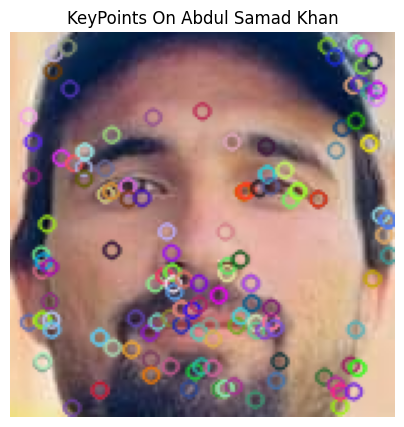

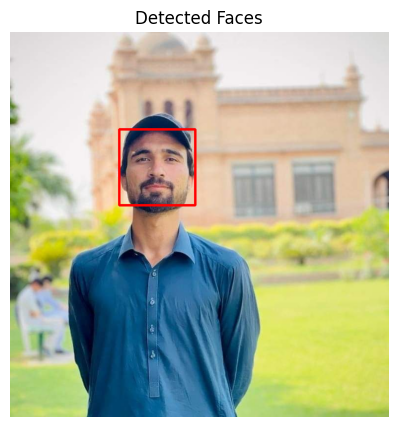

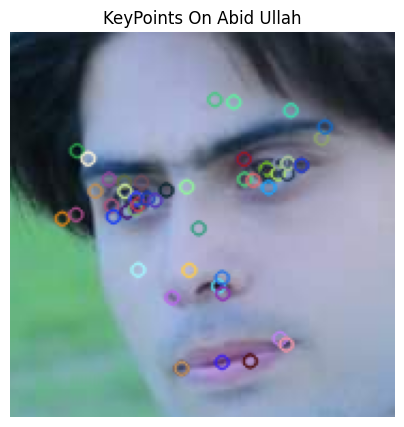

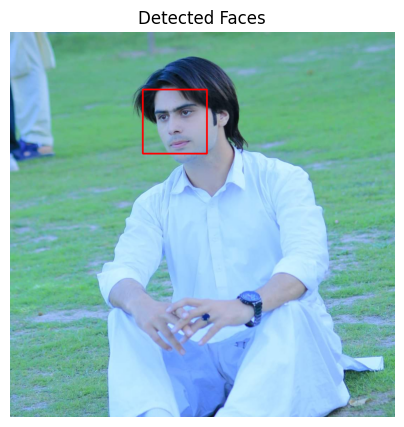

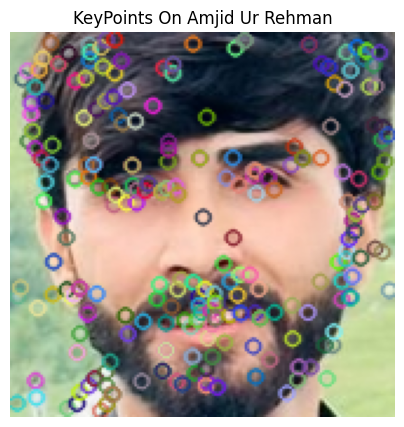

...

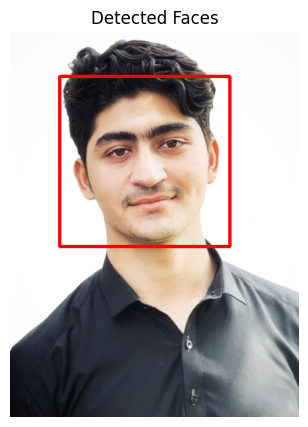

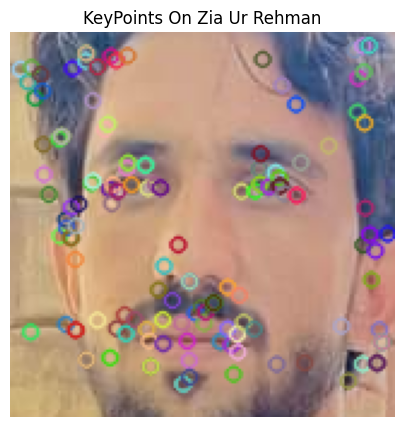

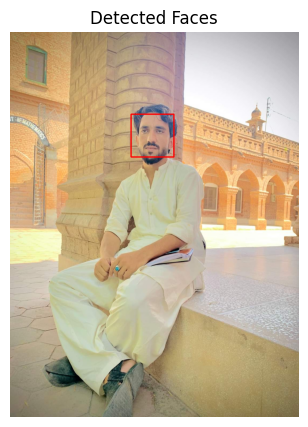

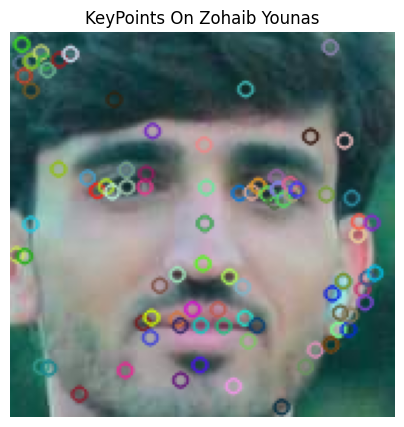

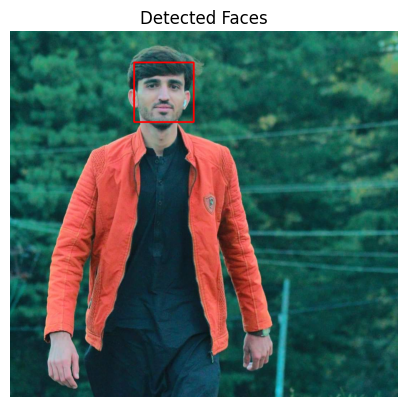

In [10]:
input_dir = 'Classmates Images'
for filename in os.listdir(input_dir):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_dir, filename)
        image = cv2.imread(image_path)

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        faces = cascade.detectMultiScale(gray, scaleFactor=1.28, minNeighbors=5, minSize=(50, 50))

        # Process each detected face
        for i, (x, y, w, h) in enumerate(faces):
            face_image = image[y:y + h, x:x + w]

            # Use a unique label for each face based on the filename and face index
            label = f'{os.path.splitext(filename)[0]}'

            # Check if the label already exists, if not, extract and store SIFT features
            if label not in labels_dict:
                keyPoints, descriptor = sift.detectAndCompute(face_image, None)

                features_dict[label] = descriptor
                labels_dict[label] = filename

                # Save the features and labels
                np.save(features_file, features_dict)
                np.save(labels_file, labels_dict)

                # Draw key points on the face image and display it
                resultImage = cv2.drawKeypoints(face_image, keyPoints, None)
                imshow(resultImage, f'KeyPoints On {label}')

            # Draw rectangle around the detected face in the original image
            cv2.rectangle(image, (x, y), (x+w, y+h), (0, 0, 255), 3)

        imshow(image, 'Detected Faces')

### Real-Time Face Recognition from Video
* Open system camera and use haar cascade algorithm to detect face and find sift feature descriptor of face detected on real time and then match it with the already find feature descriptors of the images,  if it match with anyone of it show label(name) on screen on realtime.

In [4]:
sift = cv2.SIFT_create()

cap = cv2.VideoCapture(0)

# Initialize variables for FPS calculation
prev_time = 0
fps = 0

bf = cv2.BFMatcher()

### Process Video Frames

In [5]:
while cap.isOpened():
    _, img = cap.read()

     # Calculate FPS
    current_time = time.time()
    fps = 1 / (current_time - prev_time)
    prev_time = current_time

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = cascade.detectMultiScale(gray, scaleFactor=1.28, minNeighbors=5, minSize=(50, 50))

    for (x, y, w, h) in faces:
        face_image = img[y:y+h, x:x+w]

        # Detect and compute key points and descriptors for the current face
        key_points, descriptor = sift.detectAndCompute(face_image, None)

        # Initialize variables to store the best match
        best_match_label = None
        best_match_distance = float('inf')

        # Compare the current descriptor with stored descriptors
        for stored_label, stored_descriptor in features_dict.items():
            matches = bf.knnMatch(descriptor, stored_descriptor, k=2)   ## Try brute force match

            # Apply ratio test
            good_matches = [m for m, n in matches if m.distance < 0.99 * n.distance]

            # Calculate the average distance of good matches
            avg_distance = np.mean([m.distance for m in good_matches])

            # Update the best match if the current one is better
            if avg_distance < best_match_distance:
                best_match_distance = avg_distance
                best_match_label = stored_label

        # Display the label if the match is good
        if best_match_label is not None:
            cv2.putText(img, labels_dict[best_match_label], (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2, cv2.LINE_AA)

        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 3)

    # Display FPS on the frame
    cv2.putText(img, f'FPS: {int(fps)}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 100, 255), 2, cv2.LINE_AA)
    cv2.imshow('Face Recognition', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

---